In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df1 = pd.read_csv('dataset.csv')

In [3]:
df1.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Aruba,ABW,"Population, total",SP.POP.TOTL,54608.0,55811.0,56682.0,57475.0,58178.0,58782.0,...,102880.0,103594.0,104257.0,104874.0,105439.0,105962.0,106442.0,106585.0,106537.0,106445.0
1,Africa Eastern and Southern,AFE,"Population, total",SP.POP.TOTL,130692579.0,134169237.0,137835590.0,141630546.0,145605995.0,149742351.0,...,567892149.0,583651101.0,600008424.0,616377605.0,632746570.0,649757148.0,667242986.0,685112979.0,702977106.0,720859132.0
2,Afghanistan,AFG,"Population, total",SP.POP.TOTL,8622466.0,8790140.0,8969047.0,9157465.0,9355514.0,9565147.0,...,31541209.0,32716210.0,33753499.0,34636207.0,35643418.0,36686784.0,37769499.0,38972230.0,40099462.0,41128771.0
3,Africa Western and Central,AFW,"Population, total",SP.POP.TOTL,97256290.0,99314028.0,101445032.0,103667517.0,105959979.0,108336203.0,...,387204553.0,397855507.0,408690375.0,419778384.0,431138704.0,442646825.0,454306063.0,466189102.0,478185907.0,490330870.0
4,Angola,AGO,"Population, total",SP.POP.TOTL,5357195.0,5441333.0,5521400.0,5599827.0,5673199.0,5736582.0,...,26147002.0,27128337.0,28127721.0,29154746.0,30208628.0,31273533.0,32353588.0,33428486.0,34503774.0,35588987.0


In [4]:
df2 = pd.read_csv('dataset2.csv')

In [5]:
df2.head()

,Country Code,Region,IncomeGroup,SpecialNotes,TableName
0,ABW,Latin America & Caribbean,High income,NaN,Aruba
1,AFE,NaN,NaN,"26 countries, stretching from the Red Sea in t...",Africa Eastern and Southern
2,AFG,South Asia,Low income,The reporting period for national accounts dat...,Afghanistan
3,AFW,NaN,NaN,"22 countries, stretching from the westernmost ...",Africa Western and Central
4,AGO,Sub-Saharan Africa,Lower middle income,The World Bank systematically assesses the app...,Angola


In [6]:
df3 = pd.read_csv('dataset3.csv')

In [7]:
df3.head()

,INDICATOR_CODE,INDICATOR_NAME,SOURCE_NOTE,SOURCE_ORGANIZATION
0,SP.POP.TOTL,"Population, total",Total population is based on the de facto defi...,(1) United Nations Population Division. World ...


In [8]:
melted_df = df1.melt(id_vars=['Country Name', 'Country Code', 'Indicator Name', 'Indicator Code'],
                    var_name='Year', value_name='Population')

In [9]:
melted_df.head(10)

,Country Name,Country Code,Indicator Name,Indicator Code,Year,Population
0,Aruba,ABW,"Population, total",SP.POP.TOTL,1960,54608.0
1,Africa Eastern and Southern,AFE,"Population, total",SP.POP.TOTL,1960,130692579.0
2,Afghanistan,AFG,"Population, total",SP.POP.TOTL,1960,8622466.0
3,Africa Western and Central,AFW,"Population, total",SP.POP.TOTL,1960,97256290.0
4,Angola,AGO,"Population, total",SP.POP.TOTL,1960,5357195.0
5,Albania,ALB,"Population, total",SP.POP.TOTL,1960,1608800.0
6,Andorra,AND,"Population, total",SP.POP.TOTL,1960,9443.0
7,Arab World,ARB,"Population, total",SP.POP.TOTL,1960,93359407.0
8,United Arab Emirates,ARE,"Population, total",SP.POP.TOTL,1960,133426.0
9,Argentina,ARG,"Population, total",SP.POP.TOTL,1960,20349744.0


In [10]:
melted_df['Year'] = pd.to_numeric(melted_df['Year'], errors='coerce')

In [11]:
def plot_population(country_code):
    try:
        melted_df1 = melted_df[melted_df['Country Code']== country_code]
        plt.figure(figsize=(12, 6))
        sns.lineplot(data=melted_df1, x='Year', y='Population')
        plt.title(f'Population Trend for {country_code}')
        plt.xlabel('Year')
        plt.ylabel('Population')
        plt.grid(True)
        plt.show()
    except:
        pass

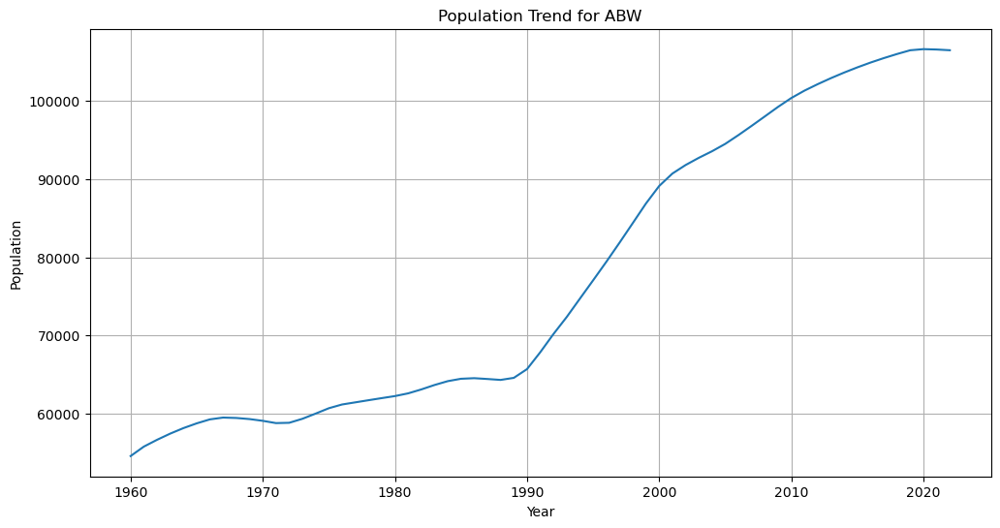

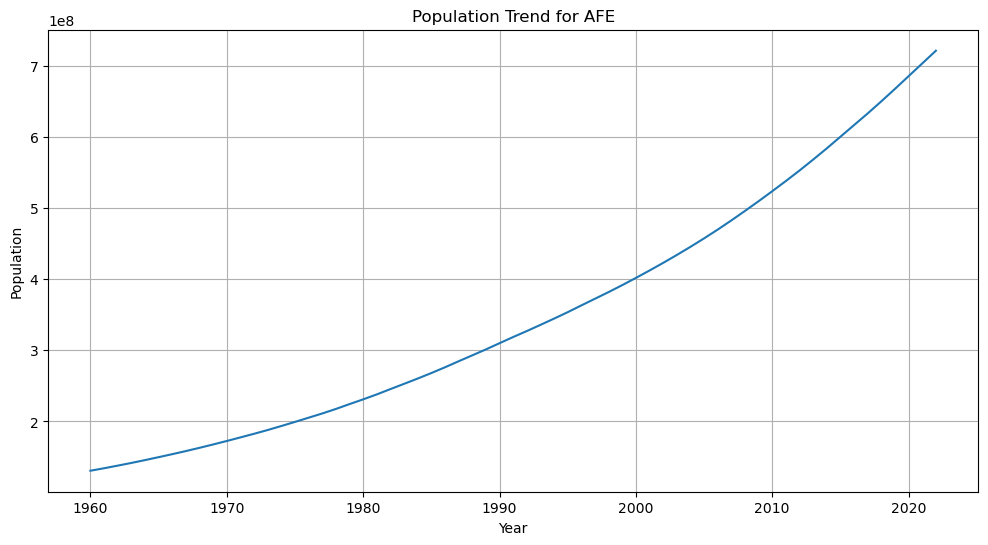

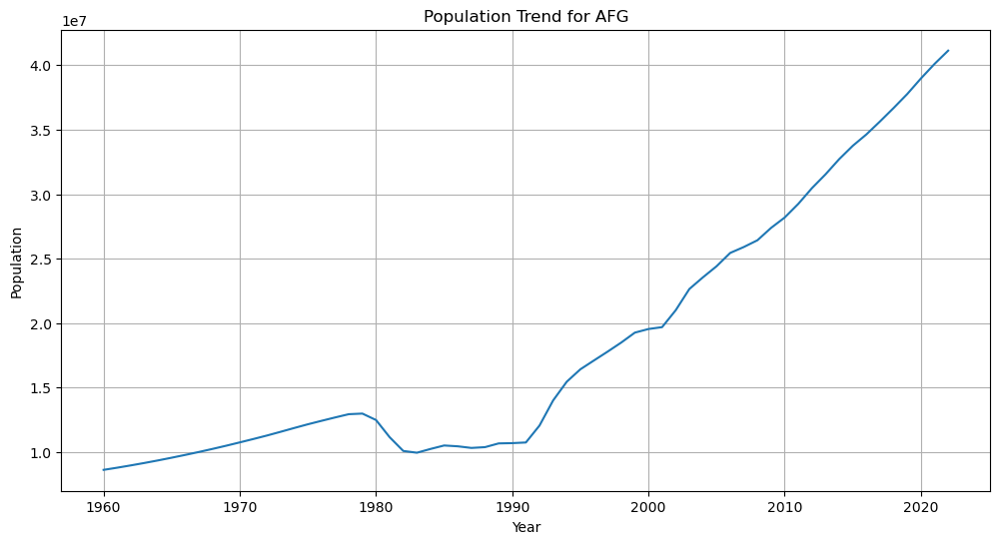

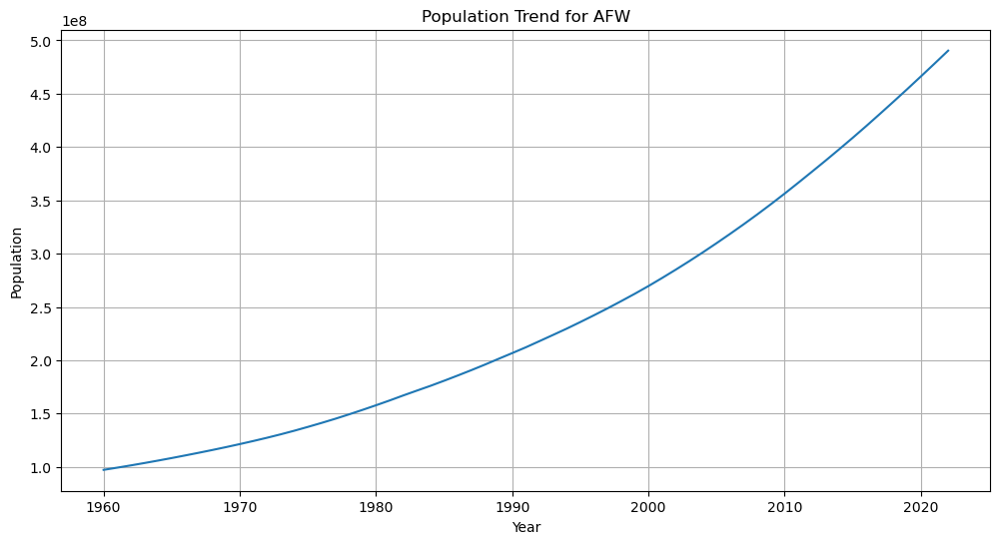

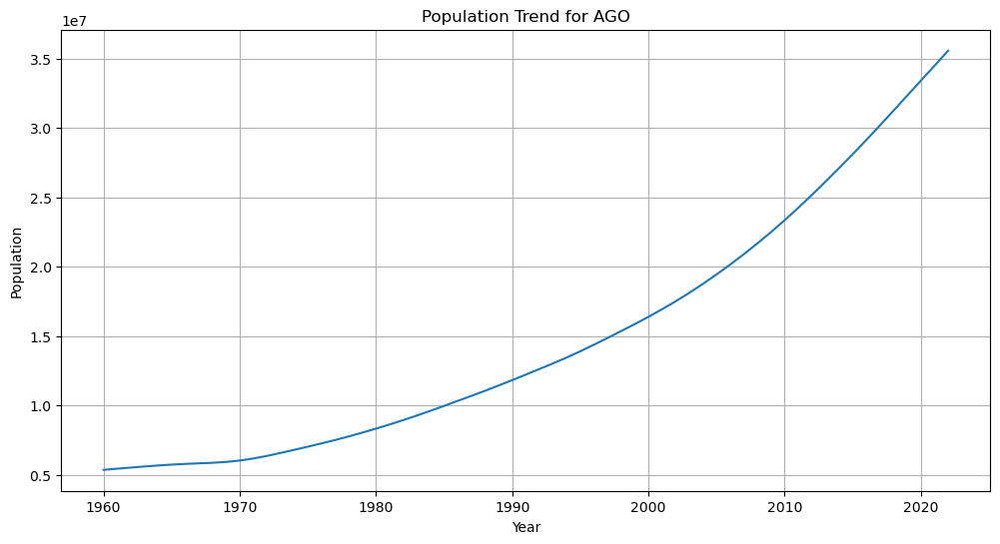

...

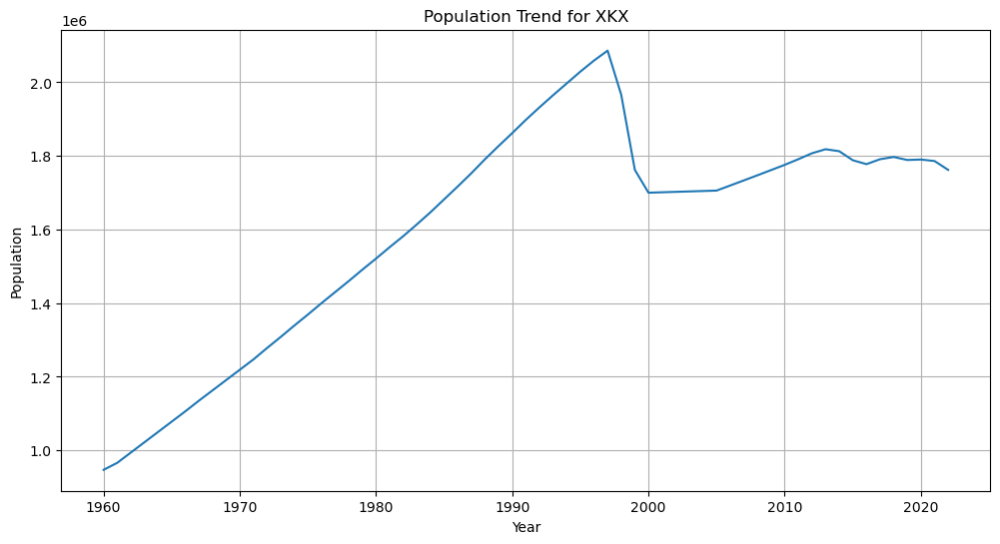

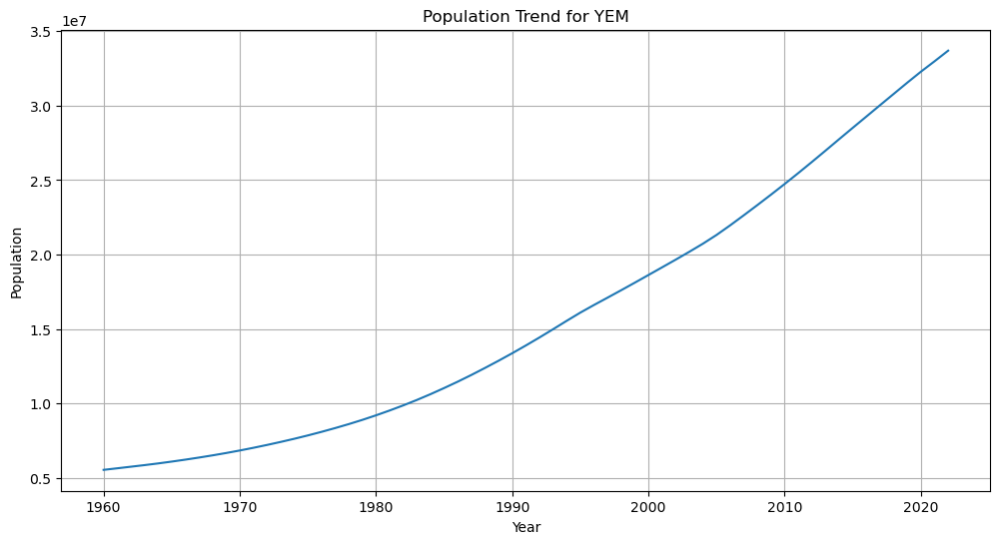

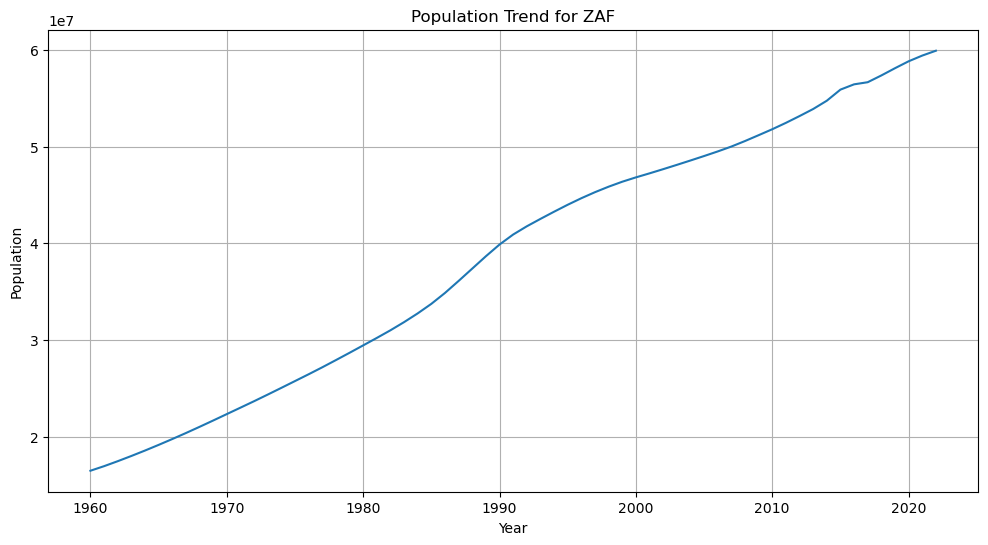

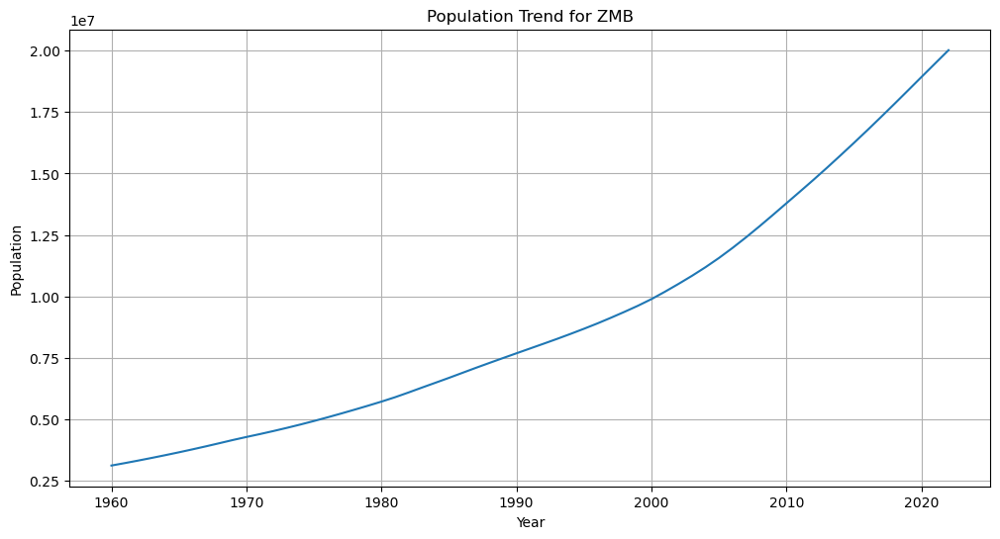

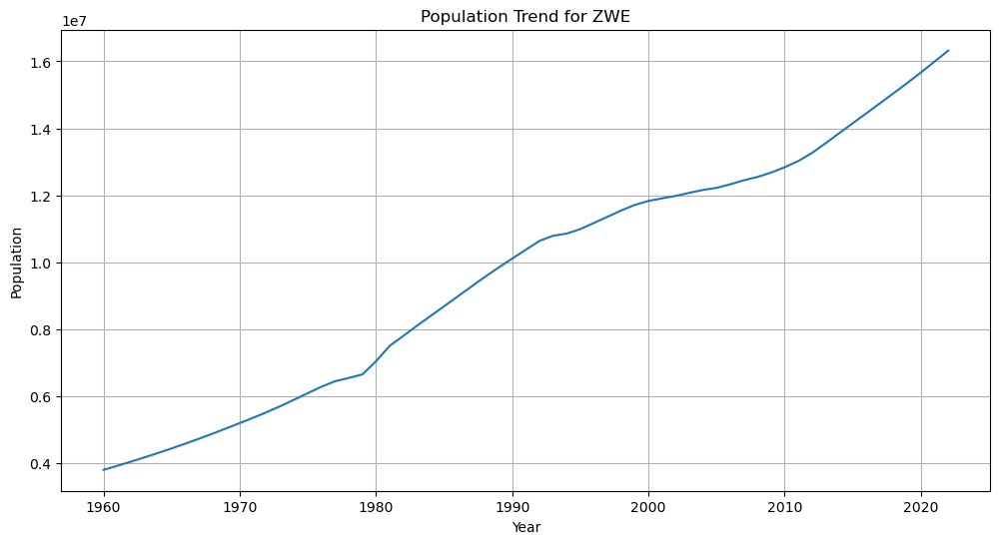

In [12]:
for country_code in list(melted_df['Country Code'].unique()):
    plot_population(country_code)

In [15]:
def plot_top_ten_and_bottom_ten(year):
    try:
        year_2000_df = df1[['Country Name', 'Country Code', year]]
        bottom_10_df = year_2000_df.sort_values(by=year, ascending=True).head(10)
        top_10_df = year_2000_df.sort_values(by=year, ascending=False).head(10)
        colors = plt.cm.viridis(np.linspace(0, 1, len(top_10_df)))
        fig, axs = plt.subplots(1, 2, figsize=(14, 6))
        axs[0].barh(bottom_10_df['Country Name'], bottom_10_df[year], color=colors)
        axs[0].set_xlabel('Population')
        axs[0].set_title(f'Bottom Ten Countries by Population in {year}')
        axs[0].invert_yaxis()
        axs[1].barh(top_10_df['Country Name'], top_10_df[year], color=colors)
        axs[1].set_xlabel('Population')
        axs[1].set_title(f'Top Ten Countries by Population in {year}')
        axs[1].invert_yaxis()

        plt.tight_layout()
        plt.show()
    except:
        pass

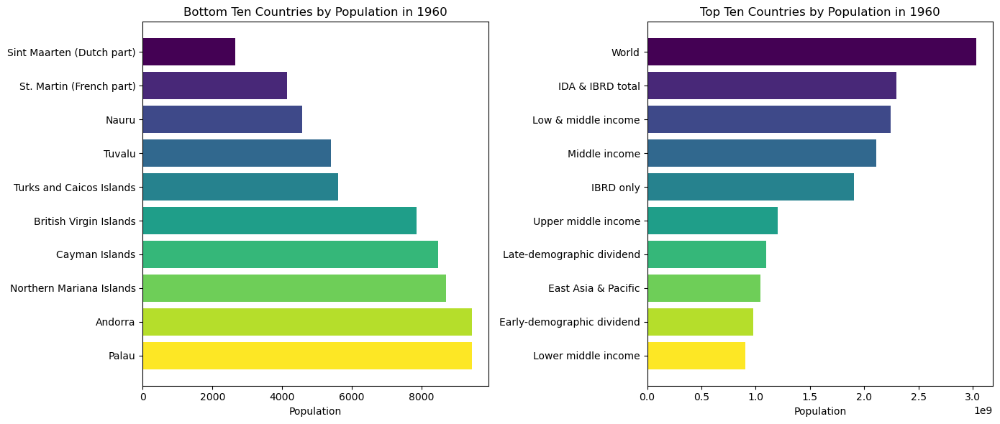

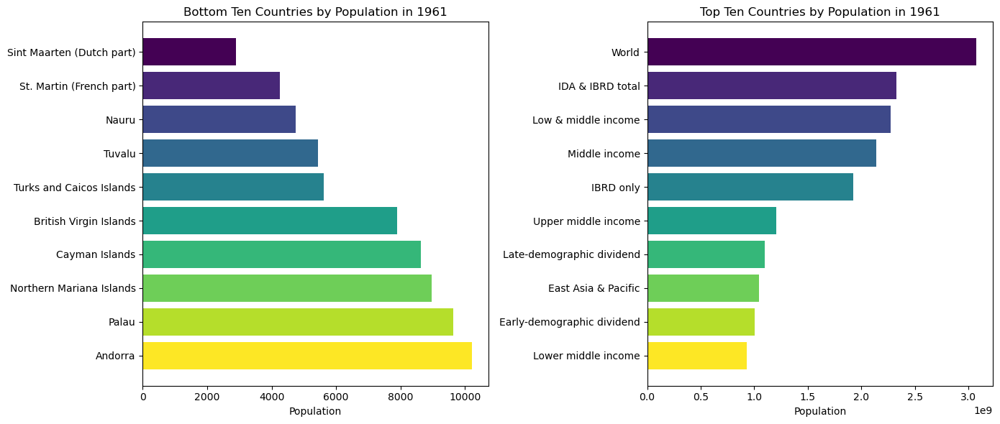

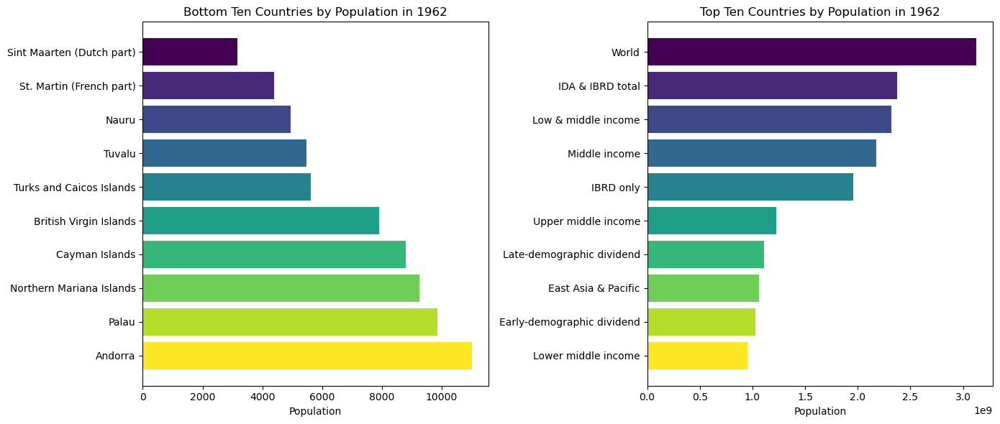

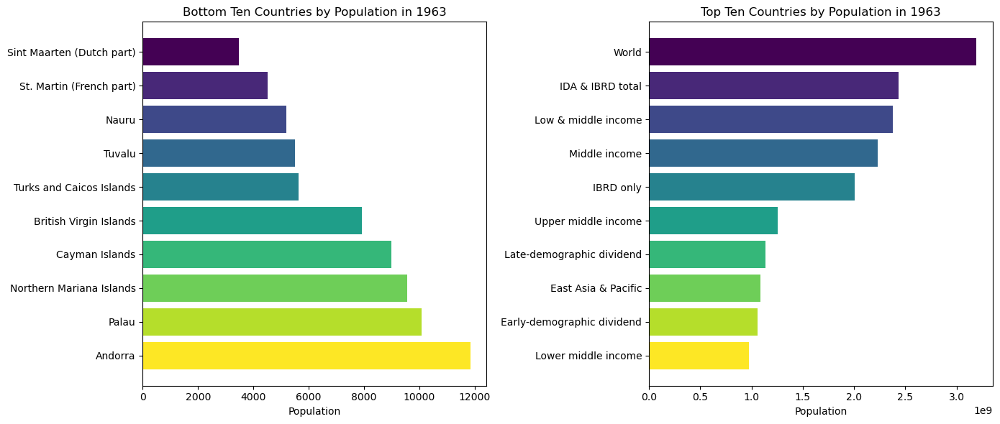

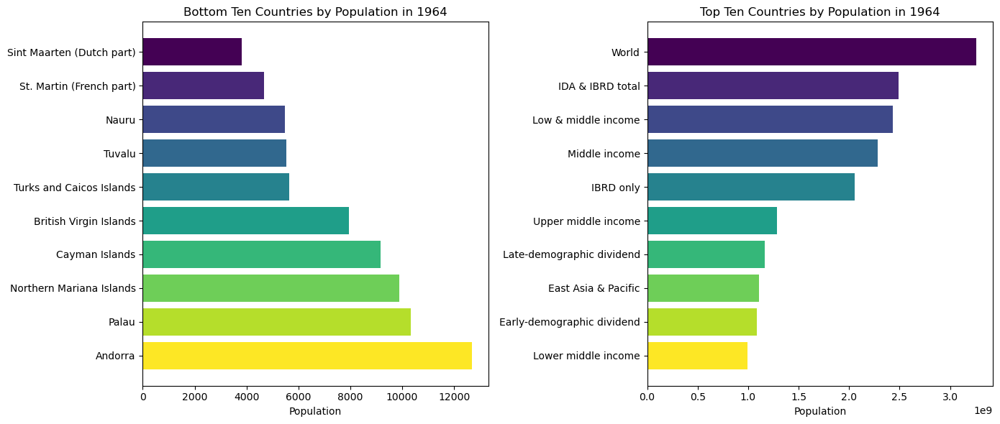

...

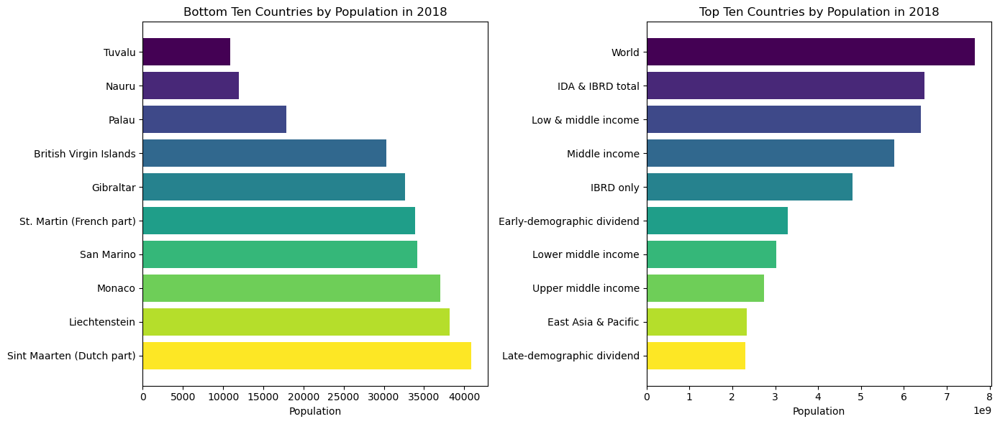

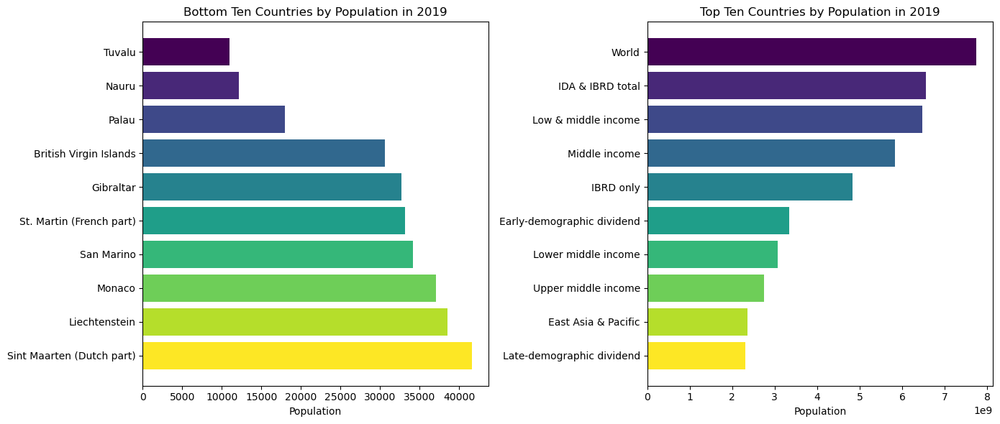

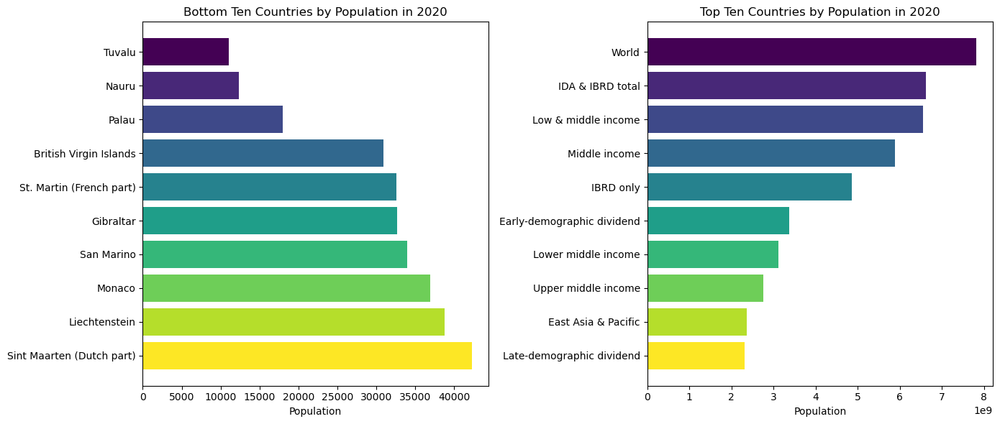

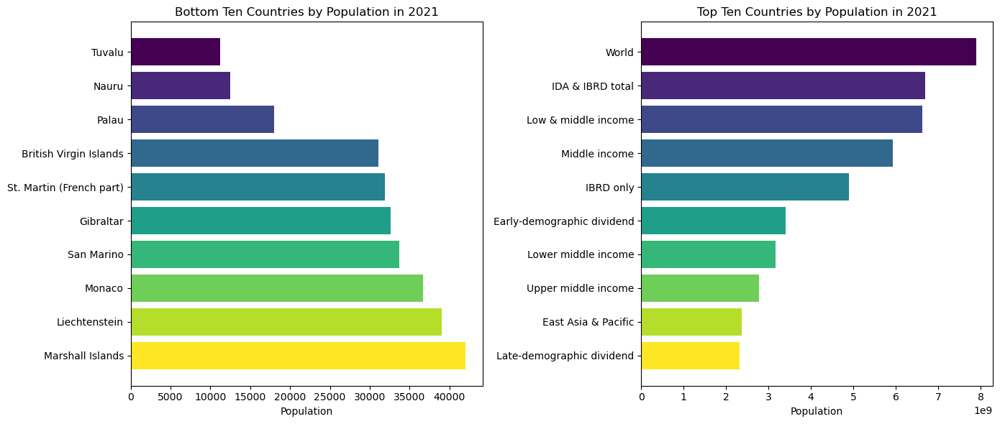

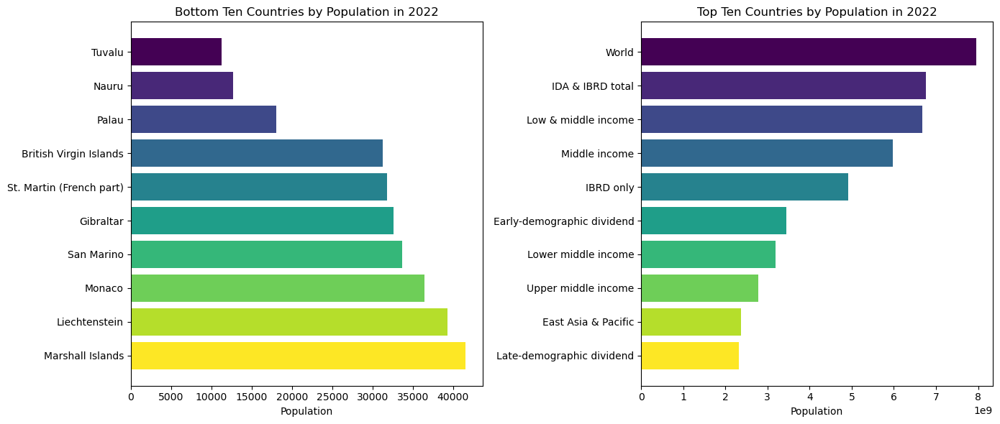

In [16]:
for year in list(melted_df['Year'].unique()):
    plot_top_ten_and_bottom_ten(str(year))